## Preparation

In [2]:
# importing required libraries
import numpy as np
from statistics import mean
import seaborn as sns
import matplotlib.pyplot as plt
import pygeostat as gs
import pandas as pd
import random
%matplotlib inline

In [3]:
# Create figure directory
import os
figfolder = 'figures_thesis'
try:
    os.mkdir(figfolder)
    print("Directory " , figfolder ,  " Created ") 
except FileExistsError:
    print("Directory " , figfolder ,  " already exists")

Directory  figures_thesis  Created 


In [4]:
#configuration of the first grid (mining face 1):
nx=10    #number of blocks in axis x
ny=16    #number of blocks in axis y
nz=1     #number of blocks in axis z

xmn=5    #origin of the first block in axis x
ymn=5    #origin of the first block in axis y
zmn=5    #origin of the first block in axis z

xsiz=10  #size of each block along axis x
ysiz=10  #size of each block along axis y
zsiz=10  #size of each block along axis z

#configuration of the second grid (mining face 2):
nx2=16   #number of blocks in axis x2
ny2=5    #number of blocks in axis y2
nz2=1    #number of blocks in axis z2

xmn2=205 #origin of the first block in axis x2
ymn2=205 #origin of the first block in axis y2
zmn2=205 #origin of the first block in axis z2

xsiz2=10 #size of each block along axis x2
ysiz2=10 #size of each block along axis y2
zsiz2=10 #size of each block along axis z2

#configuration of the processing parameters:
parcels_in_bunit = 24   #number of blocks in a blending unit
face1_face2_ratio = 2   #block extraction rate between mining face 1 and face 2

#calculations of number of blocks from face 1 and face2 that composes a blending unit
p_units = round(round(parcels_in_bunit/(face1_face2_ratio+1))*face1_face2_ratio)
p_units2= parcels_in_bunit - p_units

#adjusting to pygeosts format
grid = gs.GridDef(grid_str="{} {} {}  \n{} {} {}  \n{} {} {}".format(nx,xmn,xsiz, ny,ymn,ysiz, nz,zmn,zsiz))
grid2 = gs.GridDef(grid_str="{} {} {}  \n{} {} {}  \n{} {} {}".format(nx2,xmn2,xsiz2, ny2,ymn2,ysiz2, nz2,zmn2,zsiz2))

## generating data for the example

two mining faces are unconditionally simulated through GSLIB usgsim program

In [5]:
usgsim = gs.Program('usgsim',getpar=True)

Unable to find the provided program! Trying to use the executable pool shipped with pygeostat!
C:\Users\phaca\OneDrive\UFRGS\Tese\UAlberta files\CCG scripts\optimization\tmp2w9eiy_6\usgsim.par has been copied to the clipboard


In [6]:
usgsimpar = """               Parameters for USGSIM
               *********************

START OF MAIN:
1                             -number of realizations to generate, 0=kriging
1                             -number of variables being simulated
0                             -number of rock types to consider
69069                         -random number seed
{griddef}
{out1}                     -file for simulation output
0                             -  output format: (0=reg, 1=coord, 2=binary)
impute.out                    -file for imputed values in case of heterotopic samples
0                             -debugging level: 0,1,2,3
sgsim.dbg                     -file for debugging output 


START OF SRCH:
50                            -number of data to use per variable
500.0   500.0   10.0            -maximum search radii (hmax,hmin,vert)
45.0    0.0    0.0             -angles for search ellipsoid
0                             -sort by distance (0) or covariance (1)
1 1 1                         -if sorting by covariance, indicate variogram rock type, head, tail to use


START OF VARG:
1                             -number of variograms
1  1  1                       -rock type, variable 1, variable 2
1    0.0   1.0                -  number of structures, nugget effect, sill
1    1.0 45.0   0.0   0.0     -  type,variance,ang1,ang2,ang3
         500.0  20.0  10.0     -  a_hmax, a_hmin, a_vert


#START OF DATA:
cluster.dat                   -file with primary data
1  2  0  0  0                 -  columns for X,Y,Z,wt,rock type
3  4                          -  columns for variables
1                             -  clip data to grid, 1=yes
1                             -  assign to the grid, 0=none, 1=nearest, 2=average
-1.0       1.0e21             -  trimming limits


#START OF TRAN:
1                             -transform the data, 1=nscore
200                           -number of quantiles to keep
3                             -number of min/max values
1  1 0.0   15.0               -  rock type, variable, min, max
1  2 0.0   15.0               -  rock type, variable, min, max
1  3 0.0   15.0               -  rock type, variable, min, max
0                             -number of reference distributions
1  1                          -  rock type number, primary variable number
ref11.dat                     -   file with ref. distribution
1  0                          -   columns for value and weight
1  2                          -  rock type number, primary variable number
ref12.dat                     -   file with ref. distribution
1  0                          -   columns for value and weight


#START OF TRND:
0                             -use ordinary kriging (0=no, 1=yes)
2                             -number of locally varying means
1  1                          -  rock type number, primary variable number
lvm11.dat                     -   file with local mean
1                             -   column for value
1  2                          -  rock type number, primary variable number
lvmfl12.dat                   -   file with local mean
1                             -   column for value


#START OF SECV:
0                             -number of secondary variables to consider
-998 1E11                     -trimming limits
sgsim01.dat                   -file 1 with secondary variables
1 1                           -  number of variables in file and column numbers
sgsim02.dat                   -file 2 with secondary variables
2 1 2                         -  number of variables and column numbers
1                             -transform secondary variables


#START OF ROCK:
1  2  3                       -rock type codes
sisim.out                     -file with rock types
1                             -column for rock type


START OF MULT:
1                             -1=independent, 2=CCK, 4=CK, 5=ICCK, 6=BU
0                             -option for primary variables if BU; or for secondary variables if CK
1                             -perform cosimulation for multiple primary variables, 1=yes
1                             -rock type for correlation matrix
 1  0.6 0.7 0.5 0.6           -  correlation matrix: 1-1, 1-2, 1-3, 1-sec1, 1-sec2
0.6  1  0.4 0.3 0.4           -                      2-1, 2-2, 2-3, 2-sec1, 2-sec2
0.7 0.3  1  0.5 0.6           -                      ...
0.5 0.3 0.5  1  0.5           -                      ...
0.6 0.4 0.6 0.5  1            -                      ...



#ADDITIONAL OPTIONS:


#XYZFILE "filename" xcol ycol zcol
#SPARSE numcells
#SPLITBYREALIZATION
#COVLOOKUPOFF
#NINTEGRATE 21

#XYZFILE - specify coordinates that flag a region in the regular
#          grid for simulation. Simulation is still done on a the
#          regular grid.
#SPARSE numcells - specify the number of locations in the XYZFILE
#                  and turn on sparse output (only nodes that are
#                  simulated are output). Use with XYZFILE.
#SPLITBYREALIZATION - realizations are output to their own files
#COVLOOKUPOFF - turn off the covariance lookup table. This may be
#               required for large problems (big grid and/or many variables)
#ZERODIST value - override the minimum distance that is considered a zero
                  distance for covariance calculations
#NINTEGRATE - specify number of integration points for backtransform
#             of kriged estimates when a normal score is done.
#             If not specified, the default of 11 is used.


# If a block of parameters is not used / not required, it can be
# deleted or commented out using a pound-sign (#)
#
"""

usgsim.run(parstr=usgsimpar.format(griddef=grid,
                                   out1 = figfolder+'/sgsim.out',
))

Calling:  ['C:\\Users\\phaca\\anaconda3\\lib\\site-packages\\pygeostat\\executable\\usgsim', 'temp']

 USGSIM VERSION 4.0.5


 Reading parameters

Found keyword START OF MAIN

 Reading MAIN Parameters

 number of realizations =     1
 number of variables =        1
 number of rock types =       0
 random number seed =     69069
 X grid specification =     10   5.000       10.00    
 Y grid specification =     16   5.000       10.00    
 Z grid specification =      1   5.000       10.00    
 output file figures_thesis/sgsim.out
 output format =    0
 imputation file impute.out
 debug level =    0
 debugging file sgsim.dbg

Found keyword START OF SRC

 Reading SRCH Parameters

 number of nodes to use =   50
 search radii  =    500.0       500.0       10.00    
 search angles =    45.00       0.000       0.000    
 search sorting method =  0
 variogram index for sorting =     1    1    1

Found keyword START OF VARG

 Reading VARG Parameters

 number of variograms =    1

 variogram: rock

In [7]:
usgsimpar = """               Parameters for USGSIM
               *********************

START OF MAIN:
1                             -number of realizations to generate, 0=kriging
1                             -number of variables being simulated
0                             -number of rock types to consider
69069                         -random number seed
{griddef}
{out2}                     -file for simulation output
0                             -  output format: (0=reg, 1=coord, 2=binary)
impute.out                    -file for imputed values in case of heterotopic samples
0                             -debugging level: 0,1,2,3
sgsim.dbg                     -file for debugging output 


START OF SRCH:
50                            -number of data to use per variable
500.0   200.0   10.0            -maximum search radii (hmax,hmin,vert)
45.0    0.0    0.0             -angles for search ellipsoid
0                             -sort by distance (0) or covariance (1)
1 1 1                         -if sorting by covariance, indicate variogram rock type, head, tail to use


START OF VARG:
1                             -number of variograms
1  1  1                       -rock type, variable 1, variable 2
1    0.0   1.0                -  number of structures, nugget effect, sill
1    1.0 45.0   0.0   0.0     -  type,variance,ang1,ang2,ang3
         500.0  20.0  10.0     -  a_hmax, a_hmin, a_vert


#START OF DATA:
cluster.dat                   -file with primary data
1  2  0  0  0                 -  columns for X,Y,Z,wt,rock type
3  4                          -  columns for variables
1                             -  clip data to grid, 1=yes
1                             -  assign to the grid, 0=none, 1=nearest, 2=average
-1.0       1.0e21             -  trimming limits


#START OF TRAN:
1                             -transform the data, 1=nscore
200                           -number of quantiles to keep
3                             -number of min/max values
1  1 0.0   15.0               -  rock type, variable, min, max
1  2 0.0   15.0               -  rock type, variable, min, max
1  3 0.0   15.0               -  rock type, variable, min, max
0                             -number of reference distributions
1  1                          -  rock type number, primary variable number
ref11.dat                     -   file with ref. distribution
1  0                          -   columns for value and weight
1  2                          -  rock type number, primary variable number
ref12.dat                     -   file with ref. distribution
1  0                          -   columns for value and weight


#START OF TRND:
0                             -use ordinary kriging (0=no, 1=yes)
2                             -number of locally varying means
1  1                          -  rock type number, primary variable number
lvm11.dat                     -   file with local mean
1                             -   column for value
1  2                          -  rock type number, primary variable number
lvmfl12.dat                   -   file with local mean
1                             -   column for value


#START OF SECV:
0                             -number of secondary variables to consider
-998 1E11                     -trimming limits
sgsim01.dat                   -file 1 with secondary variables
1 1                           -  number of variables in file and column numbers
sgsim02.dat                   -file 2 with secondary variables
2 1 2                         -  number of variables and column numbers
1                             -transform secondary variables


#START OF ROCK:
1  2  3                       -rock type codes
sisim.out                     -file with rock types
1                             -column for rock type


START OF MULT:
1                             -1=independent, 2=CCK, 4=CK, 5=ICCK, 6=BU
0                             -option for primary variables if BU; or for secondary variables if CK
1                             -perform cosimulation for multiple primary variables, 1=yes
1                             -rock type for correlation matrix
 1  0.6 0.7 0.5 0.6           -  correlation matrix: 1-1, 1-2, 1-3, 1-sec1, 1-sec2
0.6  1  0.4 0.3 0.4           -                      2-1, 2-2, 2-3, 2-sec1, 2-sec2
0.7 0.3  1  0.5 0.6           -                      ...
0.5 0.3 0.5  1  0.5           -                      ...
0.6 0.4 0.6 0.5  1            -                      ...



#ADDITIONAL OPTIONS:


#XYZFILE "filename" xcol ycol zcol
#SPARSE numcells
#SPLITBYREALIZATION
#COVLOOKUPOFF
#NINTEGRATE 21

#XYZFILE - specify coordinates that flag a region in the regular
#          grid for simulation. Simulation is still done on a the
#          regular grid.
#SPARSE numcells - specify the number of locations in the XYZFILE
#                  and turn on sparse output (only nodes that are
#                  simulated are output). Use with XYZFILE.
#SPLITBYREALIZATION - realizations are output to their own files
#COVLOOKUPOFF - turn off the covariance lookup table. This may be
#               required for large problems (big grid and/or many variables)
#ZERODIST value - override the minimum distance that is considered a zero
                  distance for covariance calculations
#NINTEGRATE - specify number of integration points for backtransform
#             of kriged estimates when a normal score is done.
#             If not specified, the default of 11 is used.


# If a block of parameters is not used / not required, it can be
# deleted or commented out using a pound-sign (#)
#
"""

usgsim.run(parstr=usgsimpar.format(griddef=grid2,
                                   out2 = figfolder+'/sgsim_mf2.out',
))

Calling:  ['C:\\Users\\phaca\\anaconda3\\lib\\site-packages\\pygeostat\\executable\\usgsim', 'temp']

 USGSIM VERSION 4.0.5


 Reading parameters

Found keyword START OF MAIN

 Reading MAIN Parameters

 number of realizations =     1
 number of variables =        1
 number of rock types =       0
 random number seed =     69069
 X grid specification =     16   205.0       10.00    
 Y grid specification =      5   205.0       10.00    
 Z grid specification =      1   205.0       10.00    
 output file figures_thesis/sgsim_mf2.out
 output format =    0
 imputation file impute.out
 debug level =    0
 debugging file sgsim.dbg

Found keyword START OF SRC

 Reading SRCH Parameters

 number of nodes to use =   50
 search radii  =    500.0       200.0       10.00    
 search angles =    45.00       0.000       0.000    
 search sorting method =  0
 variogram index for sorting =     1    1    1

Found keyword START OF VARG

 Reading VARG Parameters

 number of variograms =    1

 variogram: 

<AxesSubplot:title={'center':'variable_001'}, xlabel='Easting (m)', ylabel='Northing (m)'>

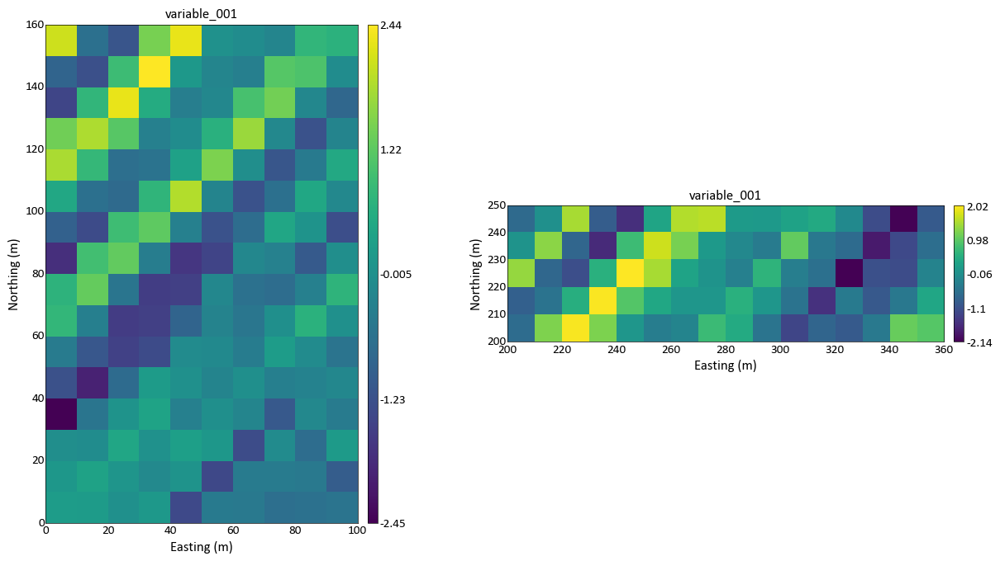

In [8]:
# visualizing simulated mining faces
fig, axes = plt.subplots(1,2, figsize=(15,8))
axes=axes.flatten()
data_file = gs.DataFile(figfolder+'\sgsim.out',griddef=grid)
data_file_mf2 = gs.DataFile(figfolder+'\sgsim_mf2.out',griddef=grid2)
gs.slice_plot(data_file, orient='xy', cmap='viridis', ax=axes[0])
gs.slice_plot(data_file_mf2, orient='xy', cmap='viridis', ax=axes[1])

In [9]:
# transforming the Gaussian simulated variable to be lognormal (this variable is metal grade)
m_ln = 0.0    #lognormal mean
sd_ln = 1.2   #lognormal std.dev.

In [10]:
# transforming the Gaussian simulated variable to be lognormal (this variable is metal grade)
data_file.data['var_ln'] = np.exp(m_ln+sd_ln*data_file.data['variable_001'])
data_file_mf2.data['var_ln'] = np.exp(m_ln+sd_ln*data_file_mf2.data['variable_001'])

<AxesSubplot:title={'center':'Histogram - Mining face B'}, xlabel='Metal grade (%)', ylabel='Frequency'>

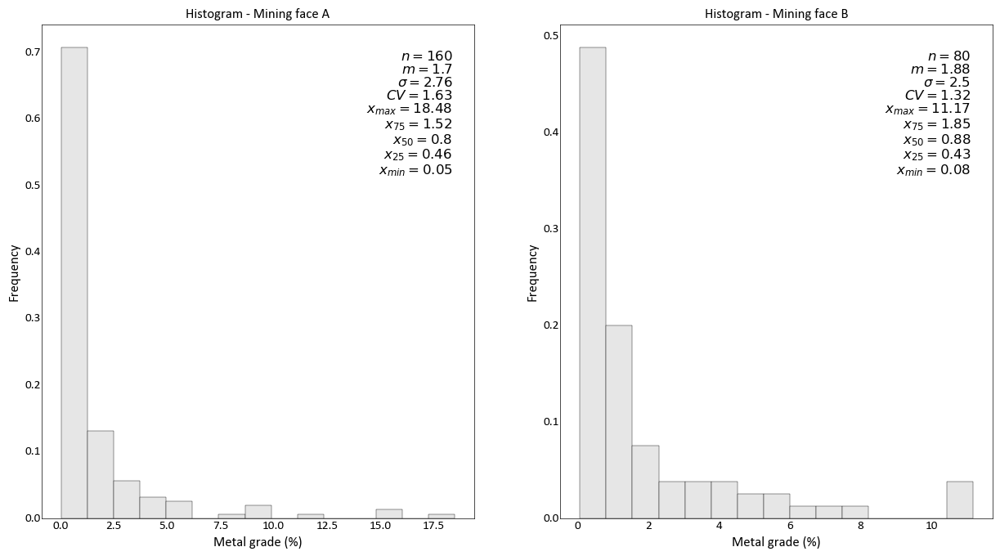

In [11]:
# visualizing metal grade histograms of each mining face
fig, axes = plt.subplots(1,2, figsize=(15,8))
axes=axes.flatten()
gs.histogram_plot(data_file.data['var_ln'], xlabel='Metal grade (%)', ax=axes[0], title = 'Histogram - Mining face A')
gs.histogram_plot(data_file_mf2.data['var_ln'], xlabel='Metal grade (%)', ax=axes[1], title = 'Histogram - Mining face B')

In [12]:
# creating a second variable from the previous simulated one. This second variable is symetric (this variable is metal recovery).
m_2 = 75   #second variable mean (%)
sd_2 = 9.0 #second variable std.dev.(%)

In [13]:
# creating a second variable from the previous simulated one. This second variable is symetric (this variable is metal recovery).
data_file.data['var2_n'] = (m_2+sd_2*data_file.data['variable_001'])/100
data_file_mf2.data['var2_n'] = (m_2+sd_2*data_file_mf2.data['variable_001'])/100

In [14]:
#visualizing data created
data_file.data

,variable_001,var_ln,var2_n
0,0.262203,1.369771,0.773598
1,0.227183,1.313401,0.770446
2,0.006386,1.007693,0.750575
3,0.159510,1.210959,0.764356
4,-1.377812,0.191403,0.625997
...,...,...,...
155,0.025165,1.030659,0.752265
156,-0.065964,0.923895,0.744063
157,-0.215787,0.771866,0.730579
158,0.770770,2.521677,0.819369


<AxesSubplot:xlabel='var_ln', ylabel='var2_n'>

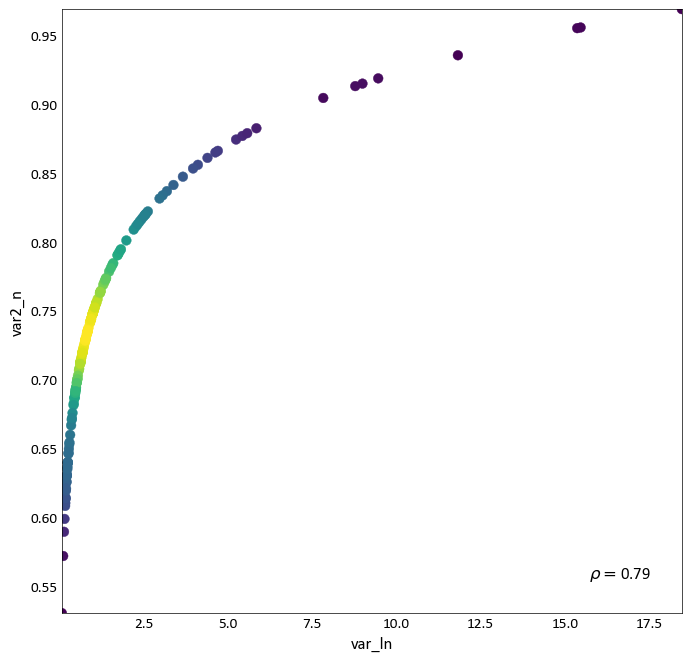

In [15]:
#visualizing variable 1 and 2 relationship
gs.scatter_plot(data_file.data['var_ln'],data_file.data['var2_n'])

<AxesSubplot:title={'center':'Histogram - Mining face B'}, xlabel='Metal recovery (%)', ylabel='Frequency'>

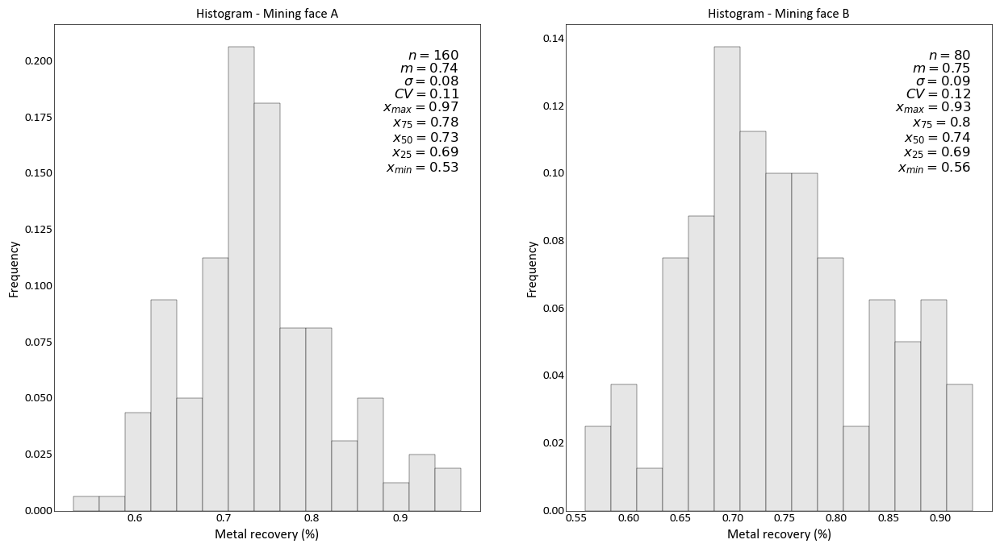

In [16]:
# visualizing metal recovery histograms of each mining face
fig, axes = plt.subplots(1,2, figsize=(15,8))
axes=axes.flatten()
gs.histogram_plot(data_file.data['var2_n'], xlabel='Metal recovery (%)', ax=axes[0], title = 'Histogram - Mining face A')
gs.histogram_plot(data_file_mf2.data['var2_n'], xlabel='Metal recovery (%)', ax=axes[1], title = 'Histogram - Mining face B')

<AxesSubplot:xlabel='Easting (m)', ylabel='Northing (m)'>

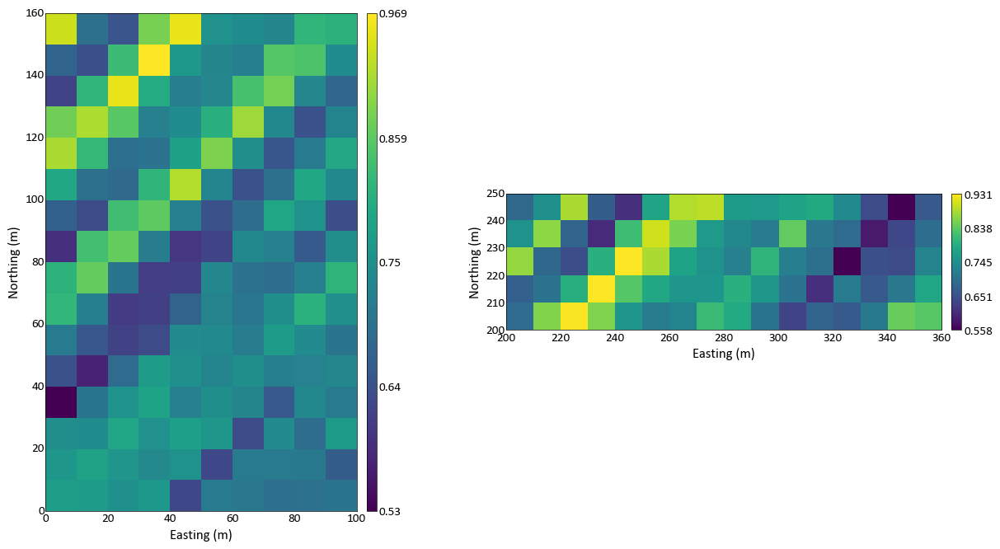

In [17]:
# visualizing metal recovery distribution in each mining face
fig, axes = plt.subplots(1,2, figsize=(15,8))
axes=axes.flatten()
gs.slice_plot(data_file.data['var2_n'],griddef=grid, orient='xy', cmap='viridis', ax=axes[0])
gs.slice_plot(data_file_mf2.data['var2_n'],griddef=grid2, orient='xy', cmap='viridis', ax=axes[1])

In [18]:
#assigning mass units for each block and their status:
data_file.data['mass'] = 1
data_file_mf2.data['mass'] = 1

data_file.data['mined_mask'] = 0     #(0 if not mined, 1 if already mined)
data_file_mf2.data['mined_mask'] = 0 #(0 if not mined, 1 if already mined)


## adjusting the data to lists as required for blending code

In [19]:
#input data as lists: recovery data, grade data, mass data, mined_parcel_mask data
n_values=nx*ny*nz #total number of blocks in mining face 1
data_g = data_file.data['var_ln'].values.flatten().tolist() #list of grade values in mining face 1
data_m = data_file.data['mass'].values.flatten().tolist()   #list of mass values in mining face 1
data_r = data_file.data['var2_n'].values.flatten().tolist() #list of metal recovery values in mining face 1
mined_mask = data_file.data['mined_mask'].values.flatten().tolist() #list of mined blocks in mining face 1

#input data as lists: recovery data, grade data, mass data, mined_parcel_mask data
n_values2=nx2*ny2*nz2  
data_g2 = data_file_mf2.data['var_ln'].values.flatten().tolist()  
data_m2 = data_file_mf2.data['mass'].values.flatten().tolist()
data_r2 = data_file_mf2.data['var2_n'].values.flatten().tolist()
mined_mask2 = data_file_mf2.data['mined_mask'].values.flatten().tolist()

In [20]:
#allocating grid memory
pv = np.zeros((nx, ny,nz))
gradev = np.zeros((nx, ny,nz))
massv = np.zeros((nx, ny,nz))
pv_mined=np.zeros((nx, ny,nz))

#allocating grid2 memory
pv2 = np.zeros((nx2, ny2,nz2))
gradev2 = np.zeros((nx2, ny2,nz2))
massv2 = np.zeros((nx2, ny2,nz2))
pv_mined2=np.zeros((nx2, ny2,nz2))

#calculating quantity of blend units
total_p = int(n_values)
mined_p = sum(x==1 for x in mined_mask)
proh_p = sum(x==999 for x in mined_mask)
b_units = int((total_p-mined_p-proh_p)/p_units)

#calculating quantity of blend units in grid2
total_p2 = int(n_values2)
mined_p2 = sum(x==1 for x in mined_mask2)
proh_p2 = sum(x==999 for x in mined_mask2)
b_units2 = int((total_p2-mined_p2-proh_p2)/p_units2)

In [21]:
#assign values in grid according to data list

#attribute value, grade, mass and mined_mask
icol=0
for iz in range(nz):
    for iy in range(ny):
        for ix in range(nx):
            pv[ix][iy][iz], gradev[ix][iy][iz], massv[ix][iy][iz], pv_mined[ix][iy][iz] = data_r[icol], data_g[icol], data_m[icol], mined_mask[icol] 
            icol+=1      
            
#assign values in grid2 according to data list
#attribute value2, grade2, mass2 and mined_mask2
icol=0
for iz in range(nz2):
    for iy in range(ny2):
        for ix in range(nx2):
            pv2[ix][iy][iz], gradev2[ix][iy][iz], massv2[ix][iy][iz], pv_mined2[ix][iy][iz] = data_r2[icol], data_g2[icol], data_m2[icol], mined_mask2[icol] 
            icol+=1      

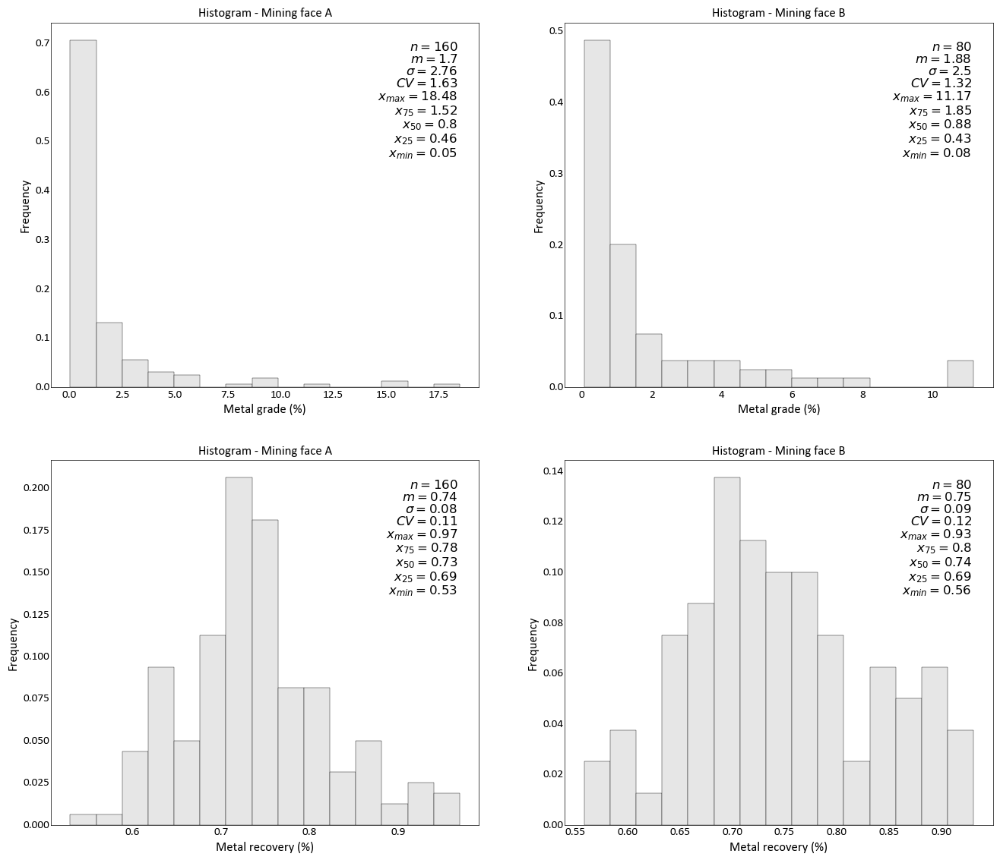

In [22]:
#visualizing attributes
fig, axes = plt.subplots(2,2, figsize=(16,14))
axes=axes.flatten()
gs.histogram_plot(data_g, xlabel='Metal grade (%)', ax=axes[0], title = 'Histogram - Mining face A')
gs.histogram_plot(data_g2, xlabel='Metal grade (%)', ax=axes[1], title = 'Histogram - Mining face B')
gs.histogram_plot(data_file.data['var2_n'], xlabel='Metal recovery (%)', ax=axes[2], title = 'Histogram - Mining face A')
gs.histogram_plot(data_file_mf2.data['var2_n'], xlabel='Metal recovery (%)', ax=axes[3], title = 'Histogram - Mining face B')
plt.savefig (figfolder+'/hist_grade.png', bbox_inches = 'tight', dpi = 300)

In [23]:
#creating another variable: recoverable metal (gr)
gr = np.multiply(data_g,data_r)
gr2 = np.multiply(data_g2,data_r2)

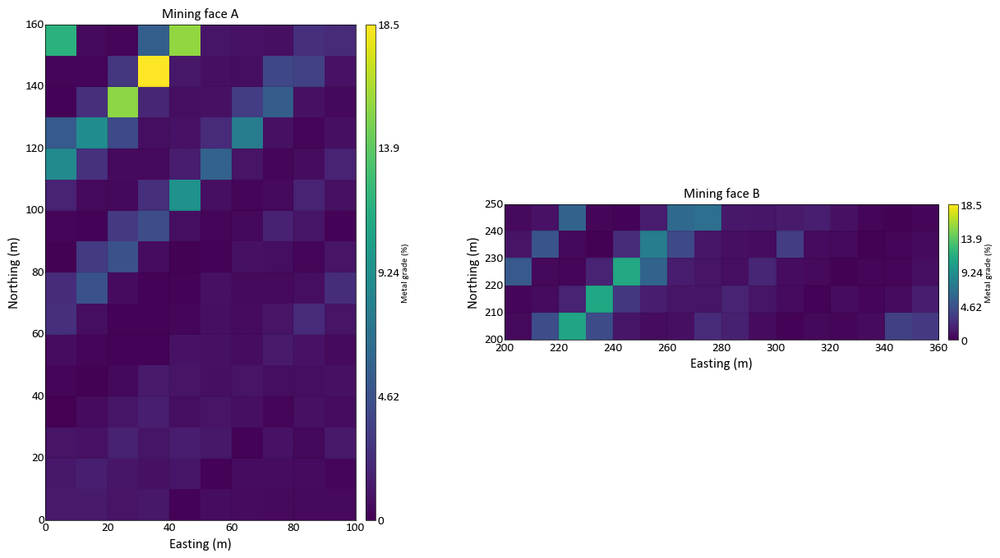

In [24]:
#visuaizing grade in each mining face
fig, axes = plt.subplots(1,2, figsize=(15,8))
axes=axes.flatten()
gs.slice_plot(data=gradev.flatten(order='F'),griddef=grid, ax=axes[0],vlim=(0.0,max(data_g+data_g2)),grid=True, title='Mining face A', cbar_label='Metal grade (%)')
gs.slice_plot(data=gradev2.flatten(order='F'),griddef=grid2, ax=axes[1],vlim=(0.0,max(data_g+data_g2)),grid=True,title='Mining face B', cbar_label='Metal grade (%)')
plt.savefig (figfolder+'/mfaces_grade.png', bbox_inches = 'tight', dpi = 300)

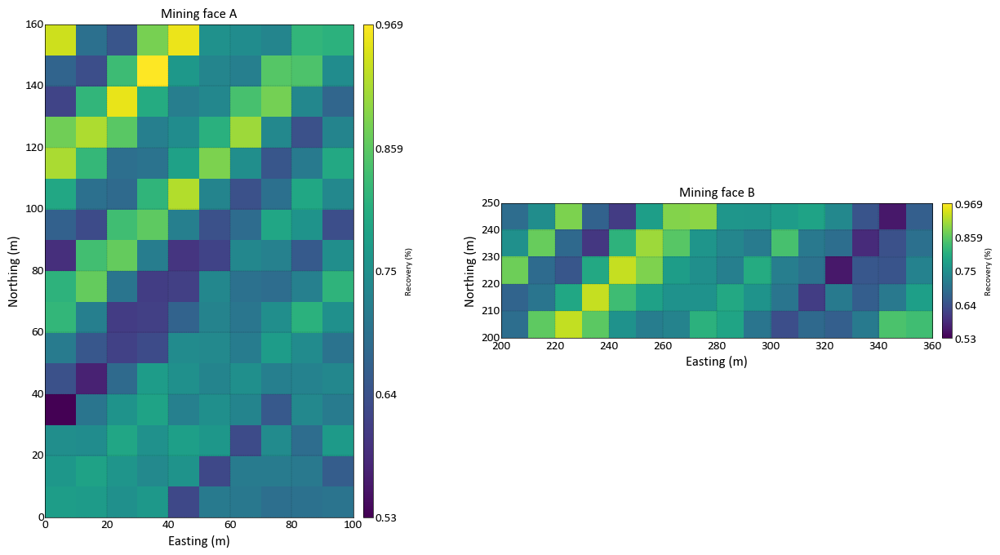

In [25]:
#visuaizing meal recovery in each mining face
fig, axes = plt.subplots(1,2, figsize=(15,8))
axes=axes.flatten()
gs.slice_plot(data=pv.flatten(order='F'),griddef=grid, ax=axes[0],vlim=(min(data_r+data_r2),max(data_r+data_r2)),grid=True, title='Mining face A', cbar_label='Recovery (%)')
gs.slice_plot(data=pv2.flatten(order='F'),griddef=grid2, ax=axes[1],vlim=(min(data_r+data_r2),max(data_r+data_r2)),grid=True,title='Mining face B', cbar_label='Recovery (%)')
plt.savefig (figfolder+'/mfaces_rec.png', bbox_inches = 'tight', dpi = 300)

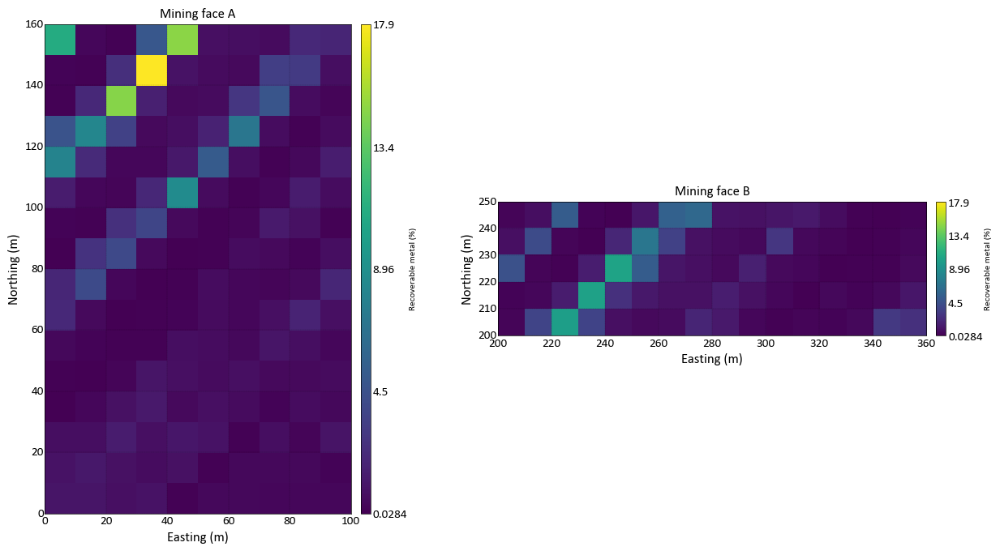

In [26]:
#visuaizing recoverable metal in each mining face
fig, axes = plt.subplots(1,2, figsize=(15,8))
axes=axes.flatten()
gs.slice_plot(data=gr.flatten(order='F'),griddef=grid,ax=axes[0], vlim=(min(gr.tolist()+gr2.tolist()),max(gr.tolist()+gr2.tolist())), grid=True, title='Mining face A',cbar_label='Recoverable metal (%)')
gs.slice_plot(data=gr2.flatten(order='F'),griddef=grid2, ax=axes[1],vlim=(min(gr.tolist()+gr2.tolist()),max(gr.tolist()+gr2.tolist())),grid=True,title='Mining face B', cbar_label='Recoverable metal (%)')
plt.savefig (figfolder+'/gr.png', bbox_inches = 'tight', dpi = 300)

In [27]:
mfA = pd.DataFrame(gr, columns = ['Recoverable_metal'])
mfB = pd.DataFrame(gr2, columns = ['Recoverable_metal'])

In [28]:
gs.write_gslib(mfA, flname=figfolder+'/mfA.dat')
gs.write_gslib(mfB, flname=figfolder+'/mfB.dat')

## Functions

In [29]:
def rec_blend_unit(r_list, m_list, g_list, w):
    '''This fuction computes and returns the effective recovery of a blending unit.
    INPUT:
    It takes as input a list of parcels recoveries, mass and grades and a value w (power function). 
    If w<1, synergistic blend
    If w=0, neutral blend
    If w>1, antagonistic blend: 
    OUTPUT:
    A value of effective recovery of that blend unit
    '''
    r_arr, m_arr, g_arr = np.array(r_list), np.array(m_list), np.array(g_list)
    r_num = np.sum(r_arr*m_arr*g_arr)
    r_den = np.sum(m_arr*g_arr)
    r_wt = r_num/r_den
    rmin=min(r_list)
    rmax=max(r_list)
    if rmax==rmin:
        return rmin
    else:
        blend_rec = rmin+(np.power((r_wt-rmin)/(rmax-rmin),w))*(rmax-rmin)
        return (blend_rec)

In [30]:
# function to get sum of distances between parcels for all blend units
def sum_dist(pv_blend, b_units):
    import math
    d_b_units=[]
    for i in range(1,b_units+1):
        x_lst=[]
        y_lst=[]
        for parcel in np.argwhere(pv_blend==i):
            x_lst.append(parcel[0])
            y_lst.append(parcel[1])
        x_lst_f = x_lst[1:] + [x_lst[0]]
        y_lst_f = y_lst[1:] + [y_lst[0]]
        x_diff = [abs(j-i) for i,j in zip(x_lst, x_lst_f)]
        y_diff = [abs(j-i) for i,j in zip(y_lst, y_lst_f)]
        d_lst = [math.sqrt(i**2 + j**2) for i,j in zip (x_diff,y_diff)]
        d_b_units.append(sum(d_lst))
    return (sum(d_b_units))

In [31]:
# objective function for simulated annealing
def gobj(b_r_list, m_unit, g_unit, dist_t, dist_penal):
    '''This function calculates the total metal recovery
    INPUT:
    b_r_list: list of blend recoveries
    m_unit: nested list with parcels mass
    g_unit: nested list with parcels grades
    dist_t: total movement distance to mine
    dist_penal: penalization factor for distance 
    '''
    tmr=[]
    for i,j,k in zip(b_r_list, m_unit, g_unit):
        #multiply the blended recovery (i) with the mass linear avg.(j), the wtd. avg. grade (k) and the number of parcels
        mr_bunit = i*mean(j)*(sum(np.multiply(k,j))/sum(j))*len(j)
        mr_bunit = round(mr_bunit, 9)
        tmr.append(mr_bunit)
    return ((sum(tmr) - (dist_penal*dist_t)),sum(tmr))

In [32]:
def dflt_sched(pv,pv_mined,b_units,p_units):
    '''This function makes a default schedule. It starts from left to right and goes in zigzag.
    INPUT:
    pv: array with parcels values
    pv_mined: array with parcels mined mask
    b_units: integer of blending units in that array
    p_units: integer of parcels that will make up each b_unit
    '''
    lst_dflt_blend_id = []
    pv_blend = np.zeros((pv.shape[0],pv.shape[1]))
    for blend_id in range(b_units):
        for parcel in range(p_units,0,-1):
            lst_dflt_blend_id.append(blend_id+1)
    for y in range(pv_blend.shape[1]):
        for x in range (pv_blend.shape[0]):
            if y % 2 == 0:
                if pv_mined[x][y]==1:
                    pv_blend[x][y]=0
                elif pv_mined[x][y]==999:
                    pv_blend[x][y]=999
                else:
                    pv_blend[x][y] = lst_dflt_blend_id.pop(0) 
            else:
                if pv_mined[pv_blend.shape[0]-x-1][y]==1:
                    pv_blend[pv_blend.shape[0]-x-1][y]=0
                elif pv_mined[pv_blend.shape[0]-x-1][y]==999:
                    pv_blend[pv_blend.shape[0]-x-1][y]=999
                else:
                    pv_blend[pv_blend.shape[0]-x-1][y] = lst_dflt_blend_id.pop(0)
    return (pv_blend)

In [33]:
def valid_swap(pv_blend):
    '''INPUT: 
    This function gets an array of parcels with their blending unit schedule.
    It tries to swaps parcels of two different blending units, subject to constraints.
    OUTPUT: array with different parcels schedule.
    '''
    import random
    swapvalid=False
    
    while swapvalid is not True:
        pv_blend_mod = np.copy(pv_blend)
        p1valid=False
        p2valid=False

        while p1valid is not True:
            #choose parcel1 at random
            x1 = np.random.randint(len(pv_blend_mod))
            y1 = np.random.randint(len(pv_blend_mod[x1]))

            #check p1 is valid. If not, continue p1valid while loop
            if pv_blend_mod[x1][y1]==0 or pv_blend_mod[x1][y1]==999 : #do not select value 0 (already mined) or 9999 (prohibit to mine)
                continue

            #get p1 value
            p1old = pv_blend_mod[x1][y1].copy()
            p1valid=True

        while p2valid is not True:
            #choose parcel2 at random
            x2 = np.random.randint(len(pv_blend_mod))
            y2 = np.random.randint(len(pv_blend_mod[x2]))

            #check p2 is valid. If not, continue p2valid while loop
            if pv_blend_mod[x2][y2]==0 or pv_blend_mod[x2][y2]==999 : #do not select value 0 (already mined) or 9999 (prohibit to mine)
                continue
            if pv_blend_mod[x2][y2]==p1old: #do not select if they are the same blend_unit
                continue

            #get p2 value    
            p2old = pv_blend_mod[x2][y2].copy()
            p2valid = True

        # swap p1 and p2
        pv_blend_mod[x1][y1], pv_blend_mod[x2][y2] = p2old, p1old
        
        #get neighbours
        n_above1, n_ne1, n_right1, n_se1, n_below1, n_sw1, n_left1, n_nw1 = get_neigh(pv_blend_mod, x1, y1)
        n_above2, n_ne2, n_right2, n_se2, n_below2, n_sw2, n_left2, n_nw2 = get_neigh(pv_blend_mod, x2, y2)
        
        # check if the joint p1 and p2 are valid. If not, restart swapvalid while loop
        if (p1old >= n_below2 and p1old >= n_sw2 and p1old >= n_se2) and ( #p1 geq than below and 45 degrees
            p1old <=n_above2 and p1old <=n_nw2 and p1old <=n_ne2) and (    #p1 leq than above and 45 degrees
            p2old>=n_below1 and p2old >= n_sw1 and p2old >= n_se1) and (   #p2 geq than below and 45 degrees
            p2old <=n_above1 and p2old <=n_nw1 and p2old <=n_ne1
           ):         #p2 leq than above and 45 degrees
            swapvalid=True    
    
    return (pv_blend_mod)

In [34]:
def get_neigh(pv_blend, x, y):
    '''This function inputs are an array of blend_id values and a index x,y of a parcel coordinate.
    It returns the blend_id values of the neighbours in the order: north, ne, east, se, south, sw, west, nw.
    '''
    
    #right, above, left, below
    if x<len(pv_blend)-1:
        n_right = pv_blend[x+1][y]
    else:
        n_right = 9999
    if y<len(pv_blend[x])-1:
        n_above = pv_blend[x][y+1]
    else:
        n_above = 9999
    if x>0:
        n_left = pv_blend[x-1][y]
    else:
        n_left = 9999
    if y>0:
        n_below = pv_blend[x][y-1]
    else:
        n_below = 0     
    
    #diagonals neighbors (ne,nw,sw,se)
    if x<len(pv_blend)-1 and y<len(pv_blend[x])-1:
        n_ne = pv_blend[x+1][y+1]
    else:
        n_ne = 9999
    if x>0 and y<len(pv_blend[x])-1:
        n_nw = pv_blend[x-1][y+1]
    else:
        n_nw = 9999
    if x>0 and y>0:
        n_sw = pv_blend[x-1][y-1]
    else:
        n_sw = 0
    if x<len(pv_blend)-1 and y>0:
        n_se = pv_blend[x+1][y-1]
    else:
        n_se = 0
        
    return (n_above, n_ne, n_right, n_se, n_below, n_sw, n_left, n_nw)

In [35]:
def sim_annealing_2f(pv, pv_mined, gradev, massv, p_units, b_units,        #miningface1
                      pv2, pv_mined2, gradev2, massv2, p_units2, b_units2, #miningface2
                     dist_penal,                                           #penalty for shovel movement (0-nothing; 0.01 - better option if want parcels together)
                      w,                                                 #processing_par
                      n_iterations, temp):                               #sim_annealing_par
    '''
    This function uses simulated annealing to provide the better schedule considering 2 mining faces and blending.
    INPUT:
    pv = 3d array with parcels recovery or any other attribute values
    pv_mined = 3d array with 0 (not mined) or 1 (already mined) values
    gradev, massv = 3d array with parcels grade and mass values
    p_units = integer (how many parcels in a blending unit)
    b_units = integer (how many blending units)
    dist_penal = penalty factor for shovel movement (0-nothing; 0.01 - better option if want parcels together)
    w = power factor used in the nonlinear function to estimate blending attribute
    n_interation = iteration used in simulating annealing
    temp = initial temperature of annealing
    OUTPUT:
    
    '''
    import random
    import math
    
    # creating nested lists for the blend_units resulted from the 2 faces
    att_unit, m_unit, g_unit = [],[],[]
    
    #creating list of average blending attribute
    att_blend_units=[]
    
    # check all conditions that may crash the algorithm
    # check if face1 is feasible
    if np.count_nonzero(pv_mined==0) != (p_units*b_units):
        raise ValueError('number of parcels not mined in face1 are not multiple of p_units in blend')
        
     # check if face2 is feasible
    if np.count_nonzero(pv_mined2==0) != (p_units2*b_units2):
        raise ValueError('number of parcels not mined in face2 are not multiple of p_units2 in blend')
        
    #check if number of blending units in the mining faces match
    if  b_units != b_units2:
        raise ValueError('mining faces should have the same quantity of blending units to be mined') 
        
    # evaluate initial solution for simulated annealing
    # calling function defauld sched
    pv_blend = dflt_sched(pv,pv_mined,b_units,p_units)
    pv_blend2 = dflt_sched(pv2,pv_mined2,b_units2,p_units2)
    
    #calculating effective recovery per blending unit 
    for j,h in zip(range(1,b_units+1),range(1,b_units2+1)):
        #list with parcels from face1
        att_lst_unit = pv[pv_blend==j].flatten().tolist()
        m_lst_unit = massv[pv_blend==j].flatten().tolist()
        g_lst_unit = gradev[pv_blend==j].flatten().tolist()
        #list with parcels from face2
        att_lst_unit2 = pv2[pv_blend2==h].flatten().tolist()
        m_lst_unit2 = massv2[pv_blend2==h].flatten().tolist()
        g_lst_unit2 = gradev2[pv_blend2==h].flatten().tolist()
        #join list face1 and face2
        att_lst_unit.extend(att_lst_unit2)
        m_lst_unit.extend(m_lst_unit2)
        g_lst_unit.extend(g_lst_unit2)
        #impute values in nested lists for the blend_units resulted from the 2 faces
        att_unit.append(att_lst_unit)
        m_unit.append(m_lst_unit)
        g_unit.append(g_lst_unit)
        
        #calculate effective recovery for each blend unit and append in a list
        att_blend_units.append(rec_blend_unit(att_lst_unit,m_lst_unit,g_lst_unit,w))
        
    # evaluate initial solution
    dist = sum_dist(pv_blend, b_units)
    dist2 = sum_dist(pv_blend2, b_units2)
    dist_t = dist + dist2
    blendset_eval, tmr = gobj(att_blend_units, m_unit, g_unit, dist_t, dist_penal)
    
    # setting this initial solution as current working solution and best
    curr_att_unit, curr_g_unit, curr_m_unit, curr_blend, curr_blend2, curr_blendset_eval, curr_tmr = att_unit, g_unit, m_unit, pv_blend, pv_blend2, blendset_eval, tmr
    best_att_unit, best_g_unit, best_m_unit, best_blend, best_blend2, best_blendset_eval, best_tmr  = att_unit, g_unit, m_unit, pv_blend, pv_blend2, blendset_eval, tmr
    
    #iterating 
    for it in range(n_iterations):
        
        #reset every variable
        att_blend_units.clear() #reset to 0
        att_unit, m_unit, g_unit = [], [], []
        
        #random choose a face to swap
        if np.random.randint(2, size=1)==0: #probability of 0 (1-100% (swap just face1), 2-50% (face 1 and face 2 50%))
            pv_blend = valid_swap(curr_blend)
            pv_blend2 = curr_blend2
        else:
            pv_blend = curr_blend
            pv_blend2 = valid_swap(curr_blend2)
            
        #calculating effective recovery per blending unit 
        for j,h in zip(range(1,b_units+1),range(1,b_units2+1)):
            #list with parcels from face1
            att_lst_unit = pv[pv_blend==j].flatten().tolist()
            m_lst_unit = massv[pv_blend==j].flatten().tolist()
            g_lst_unit = gradev[pv_blend==j].flatten().tolist()
            #list with parcels from face2
            att_lst_unit2 = pv2[pv_blend2==h].flatten().tolist()
            m_lst_unit2 = massv2[pv_blend2==h].flatten().tolist()
            g_lst_unit2 = gradev2[pv_blend2==h].flatten().tolist()
            #join list face1 and face2
            att_lst_unit.extend(att_lst_unit2)
            m_lst_unit.extend(m_lst_unit2)
            g_lst_unit.extend(g_lst_unit2)
            #impute values in nested lists for the blend_units resulted from the 2 faces
            att_unit.append(att_lst_unit)
            m_unit.append(m_lst_unit)
            g_unit.append(g_lst_unit)

            #calculate effective recovery for each blend unit and append in a list
            att_blend_units.append(rec_blend_unit(att_lst_unit,m_lst_unit,g_lst_unit,w))

        # evaluate candidate solution
        dist = sum_dist(pv_blend, b_units)
        dist2 = sum_dist(pv_blend2, b_units2)
        dist_t = dist + dist2
        blendset_eval, tmr = gobj(att_blend_units, m_unit, g_unit, dist_t, dist_penal)
        
        # check for new best solution
        if blendset_eval < best_blendset_eval:
            print('iteration {} found worse value: {}.'.format(it,best_blendset_eval))
        if blendset_eval == best_blendset_eval:
            print('iteration {} found equal value: {}.'.format(it,best_blendset_eval))
        if blendset_eval > best_blendset_eval:
            # store new best point
            best_att_unit, best_g_unit, best_m_unit, best_blend, best_blend2, best_blendset_eval, best_tmr = att_unit, g_unit, m_unit, pv_blend, pv_blend2 , blendset_eval, tmr 
            # report progress
            print('iteration {} found better value: {}'.format(it,blendset_eval))
            
        # difference between candidate and current point evaluation
        diff = -(blendset_eval - curr_blendset_eval)
        # calculate temperature for current iteration
        t = temp / float(it + 1)
        # calculate metropolis acceptance criterion
        metropolis = math.exp(-diff / t)
        # check if we should keep the new point
        if np.random.rand() < metropolis and diff > 0:
            print('iteration{}, perturbing to get out of local maxima'.format(it))
            curr_att_unit, curr_g_unit, curr_m_unit, curr_blend, curr_blend2, curr_blendset_eval, curr_tmr = att_unit, g_unit, m_unit, pv_blend, pv_blend2, blendset_eval, tmr
        if diff < 0:
            # store the new current point
            curr_att_unit, curr_g_unit, curr_m_unit, curr_blend, curr_blend2, curr_blendset_eval, curr_tmr = att_unit, g_unit, m_unit, pv_blend, pv_blend2, blendset_eval, tmr  
        
    return (best_att_unit, best_g_unit, best_m_unit, best_blend, best_blend2, best_tmr)


In [56]:
def sim_annealing_2f_convergence(pv, pv_mined, gradev, massv, p_units, b_units,        #miningface1
                      pv2, pv_mined2, gradev2, massv2, p_units2, b_units2, #miningface2
                     dist_penal,                                           #penalty for shovel movement (0-nothing; 0.01 - better option if want parcels together)
                      w,                                                 #processing_par
                      n_iterations, temp):                               #sim_annealing_par
    '''
    This function uses simulated annealing to provide the better schedule considering 2 mining faces and blending.
    INPUT:
    pv = 3d array with parcels recovery or any other attribute values
    pv_mined = 3d array with 0 (not mined) or 1 (already mined) values
    gradev, massv = 3d array with parcels grade and mass values
    p_units = integer (how many parcels in a blending unit)
    b_units = integer (how many blending units)
    dist_penal = penalty factor for shovel movement (0-nothing; 0.01 - better option if want parcels together)
    w = power factor used in the nonlinear function to estimate blending attribute
    n_interation = iteration used in simulating annealing
    temp = initial temperature of annealing
    OUTPUT:
    
    '''
    import random
    import math
    
    # creating nested lists for the blend_units resulted from the 2 faces
    att_unit, m_unit, g_unit = [],[],[]
    
    #creating list of average blending attribute
    att_blend_units=[]
    
    # check all conditions that may crash the algorithm
    # check if face1 is feasible
    if np.count_nonzero(pv_mined==0) != (p_units*b_units):
        raise ValueError('number of parcels not mined in face1 are not multiple of p_units in blend')
        
     # check if face2 is feasible
    if np.count_nonzero(pv_mined2==0) != (p_units2*b_units2):
        raise ValueError('number of parcels not mined in face2 are not multiple of p_units2 in blend')
        
    #check if number of blending units in the mining faces match
    if  b_units != b_units2:
        raise ValueError('mining faces should have the same quantity of blending units to be mined') 
        
    # evaluate initial solution for simulated annealing
    # calling function defauld sched
    pv_blend = dflt_sched(pv,pv_mined,b_units,p_units)
    pv_blend2 = dflt_sched(pv2,pv_mined2,b_units2,p_units2)
    
    #calculating effective recovery per blending unit 
    for j,h in zip(range(1,b_units+1),range(1,b_units2+1)):
        #list with parcels from face1
        att_lst_unit = pv[pv_blend==j].flatten().tolist()
        m_lst_unit = massv[pv_blend==j].flatten().tolist()
        g_lst_unit = gradev[pv_blend==j].flatten().tolist()
        #list with parcels from face2
        att_lst_unit2 = pv2[pv_blend2==h].flatten().tolist()
        m_lst_unit2 = massv2[pv_blend2==h].flatten().tolist()
        g_lst_unit2 = gradev2[pv_blend2==h].flatten().tolist()
        #join list face1 and face2
        att_lst_unit.extend(att_lst_unit2)
        m_lst_unit.extend(m_lst_unit2)
        g_lst_unit.extend(g_lst_unit2)
        #impute values in nested lists for the blend_units resulted from the 2 faces
        att_unit.append(att_lst_unit)
        m_unit.append(m_lst_unit)
        g_unit.append(g_lst_unit)
        
        #calculate effective recovery for each blend unit and append in a list
        att_blend_units.append(rec_blend_unit(att_lst_unit,m_lst_unit,g_lst_unit,w))
        
    # evaluate initial solution
    dist = sum_dist(pv_blend, b_units)
    dist2 = sum_dist(pv_blend2, b_units2)
    dist_t = dist + dist2
    blendset_eval, tmr = gobj(att_blend_units, m_unit, g_unit, dist_t, dist_penal)
    
    # setting this initial solution as current working solution and best
    curr_att_unit, curr_g_unit, curr_m_unit, curr_blend, curr_blend2, curr_blendset_eval, curr_tmr = att_unit, g_unit, m_unit, pv_blend, pv_blend2, blendset_eval, tmr
    best_att_unit, best_g_unit, best_m_unit, best_blend, best_blend2, best_blendset_eval, best_tmr  = att_unit, g_unit, m_unit, pv_blend, pv_blend2, blendset_eval, tmr
    
    #code to convergence analysis
    itera_values = [0,10,20,30,40,50,100,200,300,400,500,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000,12000, 14000, 16000, 18000, 20000]
    itera_values_result=[]
    
    #iterating 
    for it in range(n_iterations):
        
        #reset every variable
        att_blend_units.clear() #reset to 0
        att_unit, m_unit, g_unit = [], [], []
        
        #random choose a face to swap
        if np.random.randint(2, size=1)==0: #probability of 0 (1-100% (swap just face1), 2-50% (face 1 and face 2 50%))
            pv_blend = valid_swap(curr_blend)
            pv_blend2 = curr_blend2
        else:
            pv_blend = curr_blend
            pv_blend2 = valid_swap(curr_blend2)
            
        #calculating effective recovery per blending unit 
        for j,h in zip(range(1,b_units+1),range(1,b_units2+1)):
            #list with parcels from face1
            att_lst_unit = pv[pv_blend==j].flatten().tolist()
            m_lst_unit = massv[pv_blend==j].flatten().tolist()
            g_lst_unit = gradev[pv_blend==j].flatten().tolist()
            #list with parcels from face2
            att_lst_unit2 = pv2[pv_blend2==h].flatten().tolist()
            m_lst_unit2 = massv2[pv_blend2==h].flatten().tolist()
            g_lst_unit2 = gradev2[pv_blend2==h].flatten().tolist()
            #join list face1 and face2
            att_lst_unit.extend(att_lst_unit2)
            m_lst_unit.extend(m_lst_unit2)
            g_lst_unit.extend(g_lst_unit2)
            #impute values in nested lists for the blend_units resulted from the 2 faces
            att_unit.append(att_lst_unit)
            m_unit.append(m_lst_unit)
            g_unit.append(g_lst_unit)

            #calculate effective recovery for each blend unit and append in a list
            att_blend_units.append(rec_blend_unit(att_lst_unit,m_lst_unit,g_lst_unit,w))

        # evaluate candidate solution
        dist = sum_dist(pv_blend, b_units)
        dist2 = sum_dist(pv_blend2, b_units2)
        dist_t = dist + dist2
        blendset_eval, tmr = gobj(att_blend_units, m_unit, g_unit, dist_t, dist_penal)
        
        # check for new best solution
        if blendset_eval < best_blendset_eval:
            print('iteration {} found worse value: {}.'.format(it,best_blendset_eval))
        if blendset_eval == best_blendset_eval:
            print('iteration {} found equal value: {}.'.format(it,best_blendset_eval))
        if blendset_eval > best_blendset_eval:
            # store new best point
            best_att_unit, best_g_unit, best_m_unit, best_blend, best_blend2, best_blendset_eval, best_tmr = att_unit, g_unit, m_unit, pv_blend, pv_blend2 , blendset_eval, tmr 
            # report progress
            print('iteration {} found better value: {}'.format(it,blendset_eval))
            
        # difference between candidate and current point evaluation
        diff = -(blendset_eval - curr_blendset_eval)
        # calculate temperature for current iteration
        t = temp / float(it + 1)
        # calculate metropolis acceptance criterion
        metropolis = math.exp(-diff / t)
        # check if we should keep the new point
        if np.random.rand() < metropolis and diff > 0:
            print('iteration{}, perturbing to get out of local maxima'.format(it))
            curr_att_unit, curr_g_unit, curr_m_unit, curr_blend, curr_blend2, curr_blendset_eval, curr_tmr = att_unit, g_unit, m_unit, pv_blend, pv_blend2, blendset_eval, tmr
        if diff < 0:
            # store the new current point
            curr_att_unit, curr_g_unit, curr_m_unit, curr_blend, curr_blend2, curr_blendset_eval, curr_tmr = att_unit, g_unit, m_unit, pv_blend, pv_blend2, blendset_eval, tmr

        #code to convergence analysis
        if it in itera_values:
            itera_values_result.append(best_tmr)    
        
    return (best_att_unit, best_g_unit, best_m_unit, best_blend, best_blend2, best_tmr, itera_values_result)

## Results

### considering that metal recovery averages linearly

In [37]:
dflt_att_unit, dflt_g_unit, dflt_m_unit, dflt_blend, dflt_blend2, dflt_tmr = sim_annealing_2f(
    pv, pv_mined, gradev, massv, p_units, b_units,        #miningface1
    pv2, pv_mined2, gradev2, massv2, p_units2, b_units2,  #miningface2
    dist_penal=0.000,                                          #penalty for shovel movement
    w=1,                                                 #processing_par
    n_iterations=0, temp=5)

In [38]:
dflt_tmr #total metal recovered (units of mass)

356.637659352

### considering that metal recovery has synergistic blending (w=0.8)

#### default schedule (zig-zag)

In [39]:
dflt_att_unit, dflt_g_unit, dflt_m_unit, dflt_blend, dflt_blend2, dflt_tmr = sim_annealing_2f(
    pv, pv_mined, gradev, massv, p_units, b_units,        #miningface1
    pv2, pv_mined2, gradev2, massv2, p_units2, b_units2,  #miningface2
    dist_penal=0.000,                                          #penalty for shovel movement
    w=0.8,                                                 #processing_par
    n_iterations=0, temp=5)

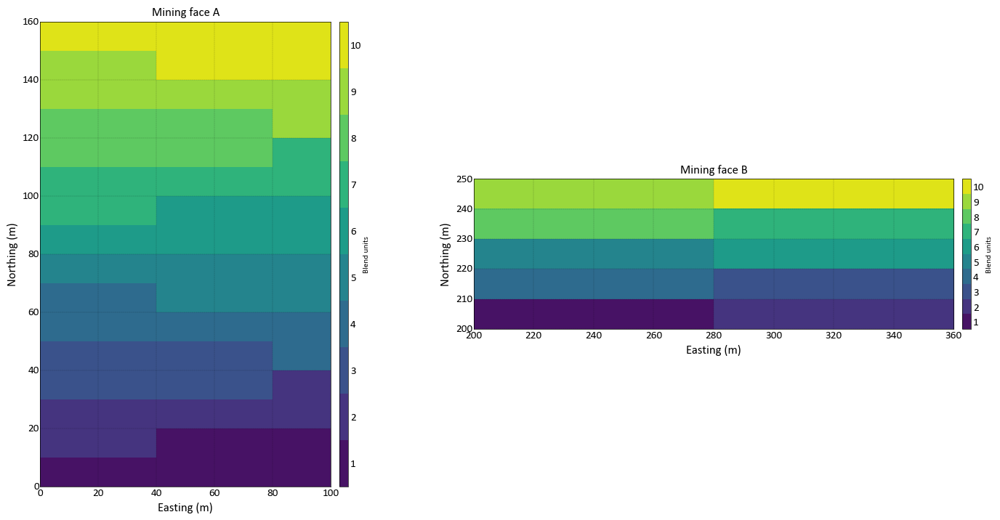

In [40]:
#visualizing default schedule
#if few units, use .astype(int)
fig, axes = plt.subplots(1,2, figsize=(15,8))
axes=axes.flatten()
_=gs.slice_plot(data=dflt_blend.astype(int).flatten(order='F'),griddef=grid,catdata=True, ax=axes[0], title='Mining face A', grid=True,cmap='viridis',cbar_label='Blend units')
_=gs.slice_plot(data=dflt_blend2.astype(int).flatten(order='F'),griddef=grid2,catdata=True, ax=axes[1],title='Mining face B',grid=True,cmap='viridis',cbar_label='Blend units')
plt.subplots_adjust (left = 0.125, bottom = 0.1, right = 1.05, top = 0.9, wspace = 0.1, hspace = 0.1)
plt.savefig (figfolder + '/figure_dflt.png', bbox_inches = 'tight', dpi = 300)

In [41]:
dflt_tmr #total metal recovered (units of mass)

362.509752909

In [42]:
dflt_tmr/240 #total metal recovered (units of mass per block)

1.5104573037875

In [43]:
# calculating recoverable metal (%)
tmr_list = np.multiply(dflt_att_unit,dflt_g_unit)
tmr_list = tmr_list.tolist()

Text(0, 0.5, 'Recoverable metal (%)')

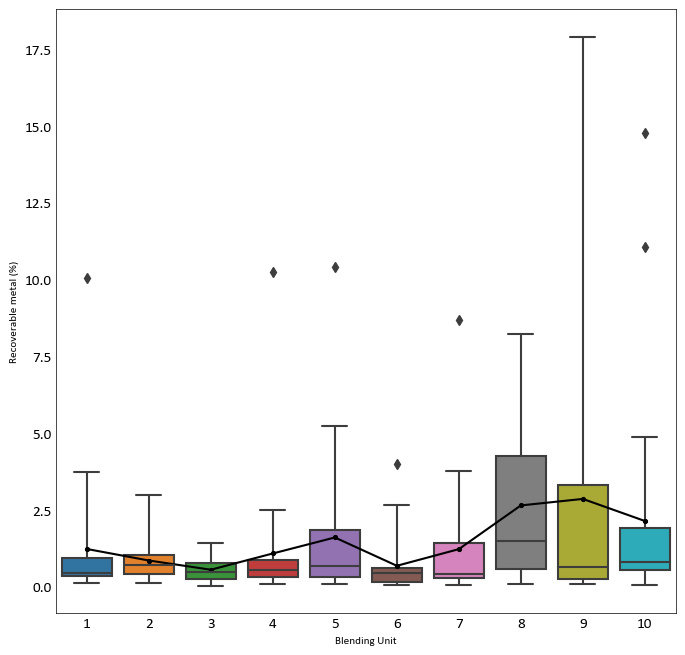

In [46]:
#visualizing box-plots of each blending unit
b_means = [np.mean(i) for i in tmr_list]
ax=sns.boxplot(data=tmr_list,whis=5)
ax=sns.lineplot(data=b_means,color='black',marker='o',markerfacecolor="black", markeredgecolor="black",markersize='3')
ax.set_xlabel('Blending Unit')
plt.xticks([0,1,2,3,4,5,6,7,8,9], [1,2,3,4,5,6,7,8,9,10])
ax.set_ylabel('Recoverable metal (%)')

#### optimized schedule

In [47]:
best_att_unit, best_g_unit, best_m_unit, best_blend, best_blend2, best_tmr = sim_annealing_2f(
    pv, pv_mined, gradev, massv, p_units, b_units,        #miningface1
    pv2, pv_mined2, gradev2, massv2, p_units2, b_units2,  #miningface2
    dist_penal=0.00,                                          #penalty for shovel movement
    w=0.8,                                                 #processing_par
    n_iterations=20000, temp=5)

iteration 0 found worse value: 362.509752909.
iteration0, perturbing to get out of local maxima
iteration 1 found worse value: 362.509752909.
iteration1, perturbing to get out of local maxima
iteration 2 found worse value: 362.509752909.
iteration2, perturbing to get out of local maxima
iteration 3 found worse value: 362.509752909.
iteration3, perturbing to get out of local maxima
iteration 4 found worse value: 362.509752909.
iteration4, perturbing to get out of local maxima
iteration 5 found worse value: 362.509752909.
iteration5, perturbing to get out of local maxima
iteration 6 found worse value: 362.509752909.
iteration 7 found worse value: 362.509752909.
iteration7, perturbing to get out of local maxima
iteration 8 found worse value: 362.509752909.
iteration 9 found worse value: 362.509752909.
iteration 10 found worse value: 362.509752909.
iteration10, perturbing to get out of local maxima
iteration 11 found worse value: 362.509752909.
iteration11, perturbing to get out of local m

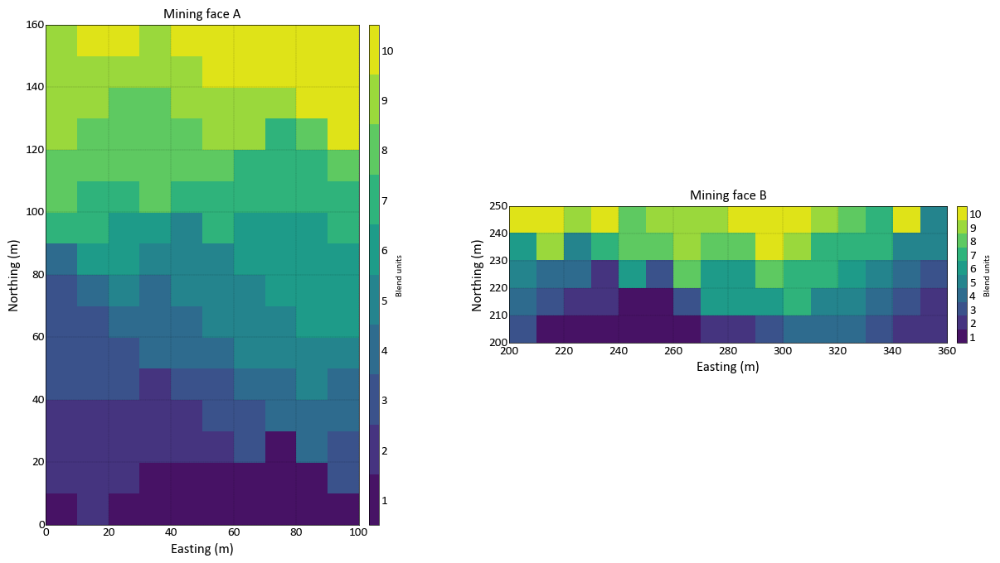

In [48]:
#visualizing optimized schedule
#if few units, use .astype(int)
fig, axes = plt.subplots(1,2, figsize=(15,8))
axes=axes.flatten()
_=gs.slice_plot(data=best_blend.astype(int).flatten(order='F'),griddef=grid,catdata=True, ax=axes[0], title='Mining face A', grid=True,cmap='viridis',cbar_label='Blend units')
_=gs.slice_plot(data=best_blend2.astype(int).flatten(order='F'),griddef=grid2,catdata=True, ax=axes[1],title='Mining face B',grid=True,cmap='viridis', cbar_label='Blend units')
plt.savefig (figfolder+'/syn_sched.png', bbox_inches = 'tight', dpi = 300)

In [49]:
best_tmr #total metal recovered (units of mass)

363.604853035

In [50]:
best_tmr/240 #total metal recovered (units of mass per block)

1.5150202209791668

In [51]:
increase = ((best_tmr-dflt_tmr)/dflt_tmr)*100
print('% increase in total metal recovered is {:.2f}%'.format(increase))

% increase in total metal recovered is 0.30%


In [52]:
best_tmr_list = np.multiply(best_att_unit,best_g_unit)
best_tmr_list = best_tmr_list.tolist()

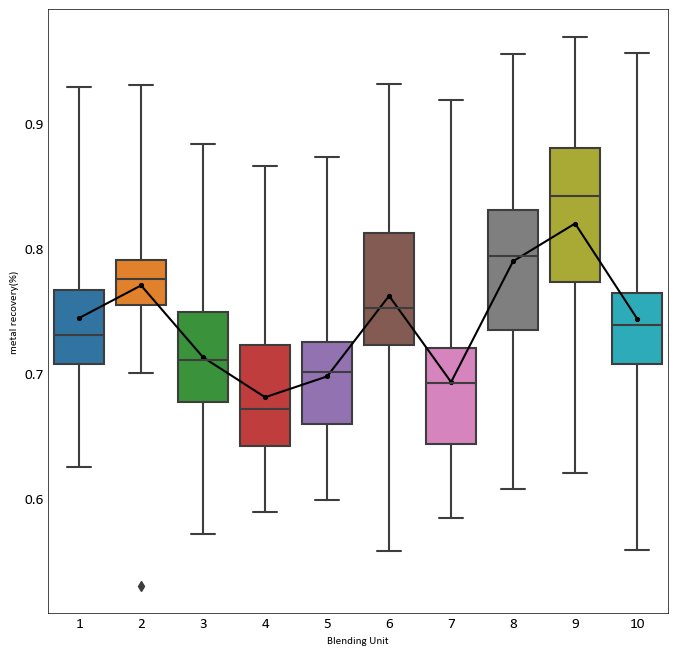

In [55]:
b_means = [np.mean(i) for i in best_att_unit]
ax=sns.boxplot(data=best_att_unit,whis=5)
ax=sns.lineplot(data=b_means,color='black',marker='o',markerfacecolor="black", markeredgecolor="black",markersize='3')
ax.set_xlabel('Blending Unit')
plt.xticks([0,1,2,3,4,5,6,7,8,9], [1,2,3,4,5,6,7,8,9,10])
ax.set_ylabel('metal recovery(%)')
plt.savefig (figfolder+'/syn_rec.png', bbox_inches = 'tight', dpi = 300)

#### convergence

In [61]:
#running the same optimization 3 different times, with different seeds
it_conv=[]

for it in range(3):
    best_att_unit, best_g_unit, best_m_unit, best_blend, best_blend2, best_tmr, conv_lst_tmr = sim_annealing_2f_convergence(
    pv, pv_mined, gradev, massv, p_units, b_units,        #miningface1
    pv2, pv_mined2, gradev2, massv2, p_units2, b_units2,  #miningface2
    dist_penal=0.00,                                          #penalty for shovel movement
    w=0.8,                                                 #processing_par
    n_iterations=20001, temp=5)
    it_conv.append(conv_lst_tmr)

iteration 0 found better value: 362.513009481
iteration 1 found worse value: 362.513009481.
iteration1, perturbing to get out of local maxima
iteration 2 found worse value: 362.513009481.
iteration2, perturbing to get out of local maxima
iteration 3 found worse value: 362.513009481.
iteration3, perturbing to get out of local maxima
iteration 4 found worse value: 362.513009481.
iteration4, perturbing to get out of local maxima
iteration 5 found worse value: 362.513009481.
iteration5, perturbing to get out of local maxima
iteration 6 found better value: 362.535284351
iteration 7 found worse value: 362.535284351.
iteration7, perturbing to get out of local maxima
iteration 8 found worse value: 362.535284351.
iteration 9 found worse value: 362.535284351.
iteration9, perturbing to get out of local maxima
iteration 10 found worse value: 362.535284351.
iteration 11 found worse value: 362.535284351.
iteration 12 found worse value: 362.535284351.
iteration 13 found worse value: 362.535284351.
it

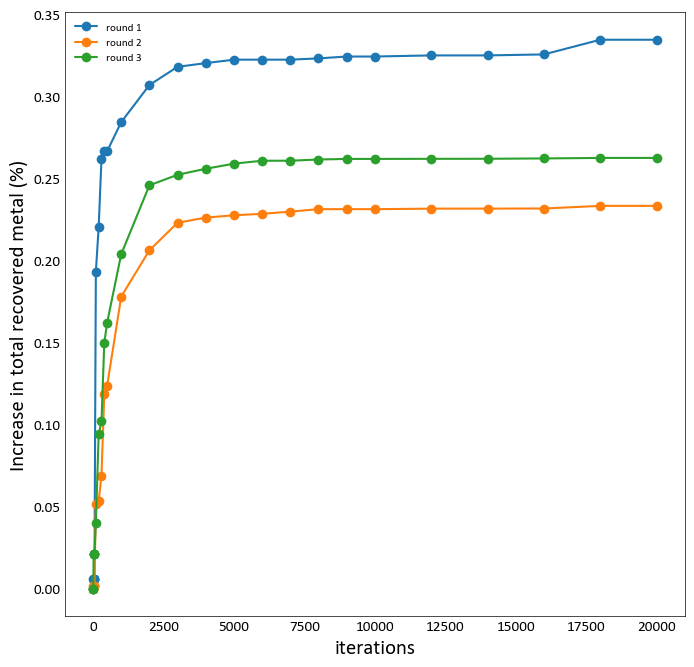

In [74]:
#visualizing if the seed changes the optimized result
plt.xlabel('iterations',fontsize=15)
plt.ylabel('Increase in total recovered metal (%)',fontsize=15)
itera_values = [0,10,20,30,40,50,100,200,300,400,500,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000, 12000, 14000, 16000, 18000, 20000]

for it in range(3):
    plt.plot(itera_values, 100*(it_conv[it]-it_conv[it][0])/it_conv[it][0], '-o', label="round {}".format(it+1))
plt.legend(loc="upper left")
plt.savefig(figfolder+'/it_conv_3times.png', bbox_inches = 'tight', dpi = 300)

### considering that metal recovery has antagonistic blending (w=2.0)

#### default schedule (zig-zag)

In [68]:
dflt_att_unit, dflt_g_unit, dflt_m_unit, dflt_blend, dflt_blend2, dflt_tmr = sim_annealing_2f(
    pv, pv_mined, gradev, massv, p_units, b_units,        #miningface1
    pv2, pv_mined2, gradev2, massv2, p_units2, b_units2,  #miningface2
    dist_penal=0.000,                                          #penalty for shovel movement
    w=2.0,                                                 #processing_par
    n_iterations=0, temp=5)

In [69]:
dflt_tmr #total metal recovered (units of mass)

331.927148047

#### optimized schedule

In [70]:
best_att_unit, best_g_unit, best_m_unit, best_blend, best_blend2, best_tmr = sim_annealing_2f(
    pv, pv_mined, gradev, massv, p_units, b_units,        #miningface1
    pv2, pv_mined2, gradev2, massv2, p_units2, b_units2,  #miningface2
    dist_penal=0.00,                                          #penalty for shovel movement
    w=2.0,                                                 #processing_par
    n_iterations=20000, temp=5)

iteration 0 found worse value: 331.927148047.
iteration0, perturbing to get out of local maxima
iteration 1 found better value: 332.032458287
iteration 2 found worse value: 332.032458287.
iteration2, perturbing to get out of local maxima
iteration 3 found better value: 332.069834136
iteration 4 found worse value: 332.069834136.
iteration4, perturbing to get out of local maxima
iteration 5 found better value: 332.086391986
iteration 6 found better value: 332.08750765800005
iteration 7 found better value: 332.08945652299997
iteration 8 found worse value: 332.08945652299997.
iteration8, perturbing to get out of local maxima
iteration 9 found worse value: 332.08945652299997.
iteration9, perturbing to get out of local maxima
iteration 10 found worse value: 332.08945652299997.
iteration10, perturbing to get out of local maxima
iteration 11 found worse value: 332.08945652299997.
iteration 12 found worse value: 332.08945652299997.
iteration 13 found worse value: 332.08945652299997.
iteration13

In [71]:
best_tmr

339.989658684

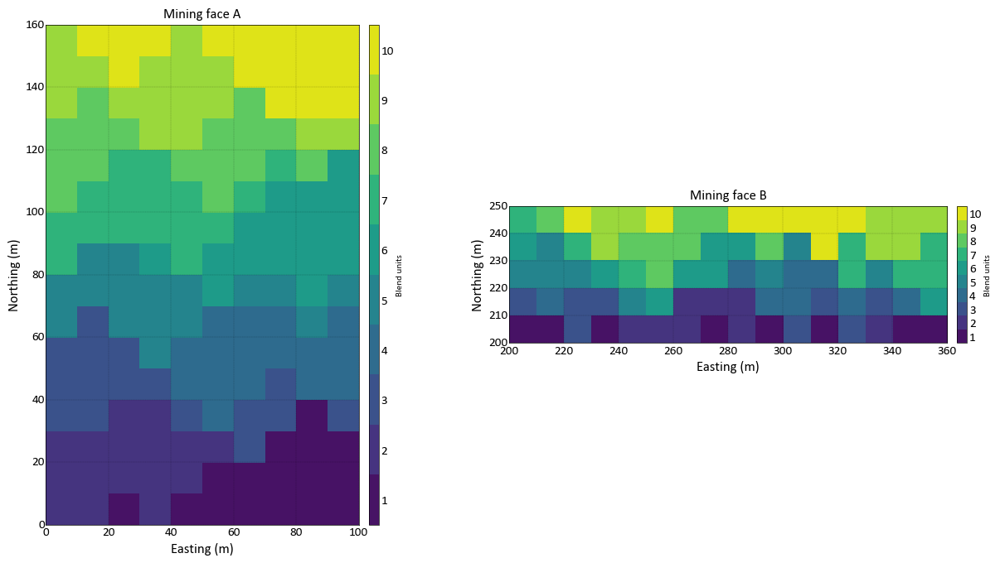

In [72]:
##visualizing optimized schedule
#if few units, use .astype(int)
fig, axes = plt.subplots(1,2, figsize=(15,8))
axes=axes.flatten()
_=gs.slice_plot(data=best_blend.astype(int).flatten(order='F'),griddef=grid,catdata=True, ax=axes[0], title='Mining face A', grid=True,cmap='viridis', cbar_label='Blend units')
_=gs.slice_plot(data=best_blend2.astype(int).flatten(order='F'),griddef=grid2,catdata=True, ax=axes[1],title='Mining face B',grid=True,cmap='viridis', cbar_label='Blend units')
plt.savefig (figfolder+'/ant_sched.png', bbox_inches = 'tight', dpi = 300)

In [73]:
increase = ((best_tmr-dflt_tmr)/dflt_tmr)*100
print('% increase in total metal recovered is {:.2f}%'.format(increase))

% increase in total metal recovered is 2.43%


In [75]:
best_tmr_list = np.multiply(best_att_unit,best_g_unit)
best_tmr_list = best_tmr_list.tolist()

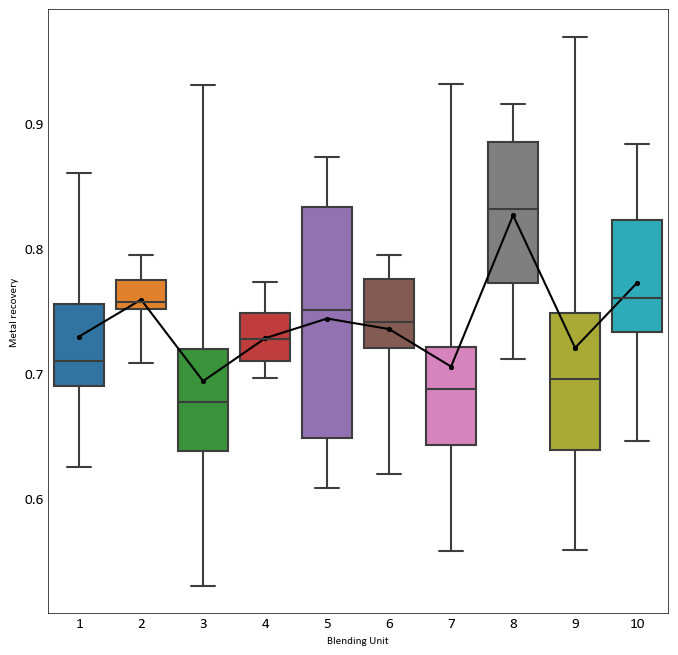

In [76]:
b_means = [np.mean(i) for i in best_att_unit]
ax=sns.boxplot(data=best_att_unit,whis=5)
ax=sns.lineplot(data=b_means,color='black',marker='o',markerfacecolor="black", markeredgecolor="black",markersize='3')
ax.set_xlabel('Blending Unit')
plt.xticks([0,1,2,3,4,5,6,7,8,9], [1,2,3,4,5,6,7,8,9,10])
ax.set_ylabel('Metal recovery')
plt.savefig (figfolder+'/ant_rec.png', bbox_inches = 'tight', dpi = 300)

#### convergence

In [85]:
#running the same optimization 3 different times, with different seeds
it_conv=[]

for it in range(3):
    best_att_unit, best_g_unit, best_m_unit, best_blend, best_blend2, best_tmr, conv_lst_tmr = sim_annealing_2f_convergence(
    pv, pv_mined, gradev, massv, p_units, b_units,        #miningface1
    pv2, pv_mined2, gradev2, massv2, p_units2, b_units2,  #miningface2
    dist_penal=0.00,                                          #penalty for shovel movement
    w=2.0,                                                 #processing_par
    n_iterations=20001, temp=5)
    it_conv.append(conv_lst_tmr)

iteration 0 found worse value: 331.927148047.
iteration0, perturbing to get out of local maxima
iteration 1 found worse value: 331.927148047.
iteration1, perturbing to get out of local maxima
iteration 2 found worse value: 331.927148047.
iteration2, perturbing to get out of local maxima
iteration 3 found worse value: 331.927148047.
iteration3, perturbing to get out of local maxima
iteration 4 found worse value: 331.927148047.
iteration4, perturbing to get out of local maxima
iteration 5 found worse value: 331.927148047.
iteration5, perturbing to get out of local maxima
iteration 6 found worse value: 331.927148047.
iteration 7 found worse value: 331.927148047.
iteration 8 found better value: 332.03387847
iteration 9 found better value: 332.110273
iteration 10 found better value: 332.11899354900004
iteration 11 found better value: 332.12212274700005
iteration 12 found worse value: 332.12212274700005.
iteration12, perturbing to get out of local maxima
iteration 13 found worse value: 332.1

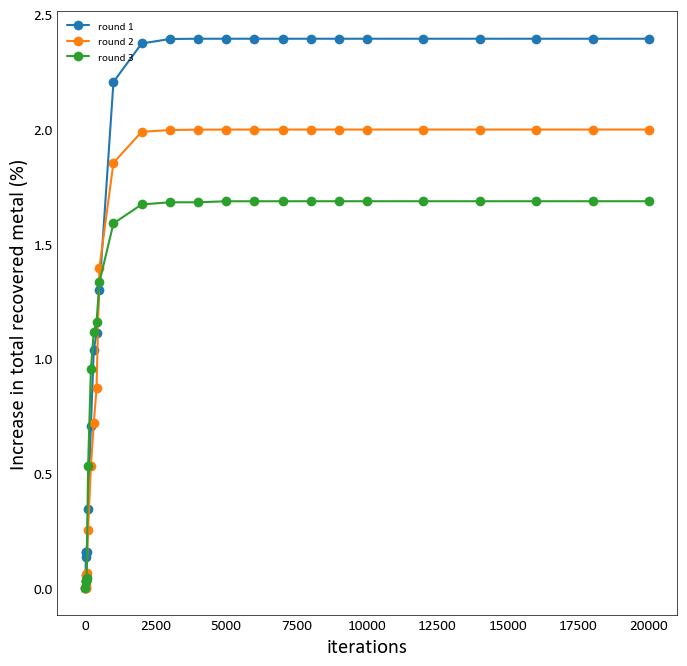

In [86]:
#visualizing if the seed changes the optimized result
plt.xlabel('iterations',fontsize=15)
plt.ylabel('Increase in total recovered metal (%)',fontsize=15)
itera_values = [0,10,20,30,40,50,100,200,300,400,500,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000, 12000, 14000, 16000, 18000, 20000]

for it in range(3):
    plt.plot(itera_values, 100*(it_conv[it]-it_conv[it][0])/it_conv[it][0], '-o', label="round {}".format(it+1))
plt.legend(loc="upper left")
plt.savefig(figfolder+'/it_conv_ant_3times.png', bbox_inches = 'tight', dpi = 300)